In [1]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
import seaborn as sns
import matplotlib.pyplot as plt
import seaborn as sns

import plotting_settings
plotting_settings.set_mpl()

from ru_graduates.map_figure import mapFigure
import plotly.io as pio
pio.renderers.default = "notebook"
from IPython.display import display

## Данные

Данные о трудоустройстве выпускников российских организаций среднего специального и высшего образования по направлениям подготовки и уровням образования, собранные из открытых дашбордов Мониторинга трудоустройства выпускников Роструда.

В датасете представлены:

- численность выпускников
- доля занятых
- средняя зарплата
- наименование региона или федерального округа
- коды ОКТМО и ОКАТО

__Данные о трудоустройстве и приведены по состоянию на 31.12.2023, о зарплате — за 12 месяцев 2023 года.__

__Источник__: Роструд, __обработка__: «Если быть точным»

<font color="gray">Трудоустройство и зарплаты выпускников по направлениям подготовки//Роструд; обработка «Если быть точным», 2024. Условия использования: Creative Commons BY 4.0. URL: https://tochno.st/datasets/graduates_fields</font>

In [2]:
smaller_df = pd.read_csv(
    'data/data_graduates_specialty_125_v20240709_csv/data_graduates_study_area_125_v20240611.csv', sep=';'
    )

fed_dist_bachelor_df = smaller_df.query(
    'object_level == "Федеральный округ" &'
    'education_level == "Бакалавриат, специалитет" &'
    'gender == "Всего"')

fed_dist_master_df = smaller_df.query(
    'object_level == "Федеральный округ" &'
    'education_level == "Магистратура" &'
    'gender == "Всего"')

# print('Пропуски в данных:', '\n')
# for column, n_empty in smaller_df.isna().sum().items():
#     if n_empty > 0:
#         print(
#             f'В "{column}" пропущено {n_empty} из {len(smaller_df)} значений'
#             f' ({n_empty / len(smaller_df):.0%})'
#             )
        
# for column in smaller_df.columns:
#     unique_values = smaller_df[column].unique()
#     if len(unique_values) < 20:
#         print(f'{column}: {unique_values}', '\n')

<div class="alert alert-info"> <b> 🔎</b> На этой карте можно узнать, к каким федеральным округам (ФО) относятся разные области России </div>

In [3]:
#| column: screen-inset-right
russia_map = mapFigure()
import plotly.express as px

regions = pd.read_parquet("data/regions/russia_regions.parquet")
fo_list = list(regions['federal_district'].unique())
colors = px.colors.qualitative.Pastel1

for i, r in regions.iterrows():
    popul_text = f"Население: <b>{r.population:_} </b>".replace('_', ' ')
    text = f'<b>{r.region}</b><br>{r.federal_district} ФО<br>{popul_text}'
    russia_map.update_traces(selector=dict(name=r.region),
        text=text,
        fillcolor=colors[fo_list.index(r.federal_district)])
russia_map.show()

***

## Топ-3 специальностей по среднему размеру зарплат по федеральным округам

В топах по округам представлены выпускники следующих спецальностей:

<img src="./data/img/engineer.png" width="25"/> <font color="#1E88E5">инженерных и технических</font>

<img src="./data/img/nerd.png" width="25"/> <font color="#ff0d57">математических и естестеннонаучных</font>

<img src="./data/img/doctor.png" width="25"/> <font color="#13B755"> медицинских </font>

<img src="./data/img/social.png" width="25"/> <font color="#FFC000">общественно-научных</font>

<img src="./data/img/rural.png" width="25"/> <font color="#7C52FF">сельскозозяйственных</font>

In [4]:
# Custom formatter function
def format_yticks(value, _):
    if value >= 1000:
        return f'{int(value/1000)}K'
    else:
        return f'{int(value)}'


def plot_top_salaries_by_fd(df, no_med=False):

    # Unique object names to iterate through
    unique_objects = df['object_name'].unique()

    # Setting up the grid (2 rows x 4 columns)
    fig, axes = plt.subplots(2, 4, figsize=(10, 8))
    axes = axes.flatten()  # Flatten the grid to make iteration easier

    # Define a color dictionary for the bars
    color_dict = {
    'Инженерное дело, технологии и технические науки': "#1E88E5",
    'Здравоохранение и медицинские науки': "#13B755",
    'Математические и естественные науки': "#ff0d57",
    'Сельское хозяйство и сельскохозяйственные науки': "#7C52FF",
    'Науки об обществе': "#FFC000",
    'Искусство и культура': "#00AEEF",
    'Образование и педагогические науки': "C2"
    }

    emoji_dict = {
    'Инженерное дело, технологии и технические науки': 'engineer',
    'Здравоохранение и медицинские науки': 'doctor',
    'Математические и естественные науки': 'nerd',
    'Сельское хозяйство и сельскохозяйственные науки': 'rural',
    'Науки об обществе': 'social',
    'Искусство и культура': 'art',
    'Образование и педагогические науки': 'books'
    }

    for i, fed_dist in enumerate(unique_objects):
        if i >= len(axes):
            break  # In case there are more unique objects than subplots

        fed_df = df.query(f'object_name == "{fed_dist}"')
        if no_med:
            fed_df = fed_df.query(
                'study_area != "Здравоохранение и медицинские науки"'
                )
        fed_stat_df = (
            fed_df.groupby('study_area')['average_salary']
            .median().nlargest(3)
        ).reset_index()  # Resetting index to get a DataFrame

        ax = axes[i]  # Selecting the corresponding subplot
        
        # Create a color mapping for hue
        fed_stat_df['color'] = fed_stat_df['study_area'].map(color_dict)
        # fed_master_stat_df['color'] = fed_master_stat_df['study_area'].map(color_dict)
        # Plot with hue and disable legend
        sns.barplot(
            x='study_area', y='average_salary', data=fed_stat_df, ax=ax,
            hue='color', palette=fed_stat_df['color'].tolist(),
            legend=False, alpha=0.7)
        
        # Setting the title for each subplot
        ax.set_title(fed_dist.replace('федеральный округ', ''), fontsize=18, y=1.05)
        ax.set_ylim(0, 1.7e5)

        ax.set_ylabel('')
        ax.set_xlabel('')

        # ax.set_xlabel('Специальность')

        # Overlaying the image on top of each bar
        for i, bar in enumerate(ax.patches):
            x0 = bar.get_x() + bar.get_width() / 2.0  # Center the image horizontally on the bar
            y0 = bar.get_height()  # Position the image at the top of the bar

            bar_legend = fed_stat_df.iloc[i].study_area
            image_file = f'{emoji_dict.get(bar_legend)}.png'
            image = plt.imread(f'data/img/{image_file}')
            image_box = OffsetImage(image, zoom=0.15)  # Adjust zoom as needed
            ab = AnnotationBbox(image_box, (x0, y0), frameon=False, xycoords='data', box_alignment=(0.5, 0.0))
            ax.add_artist(ab)

            # Turn off the upper and right frame edges
            ax.spines['right'].set_visible(False)
            ax.spines['top'].set_visible(False)
            ax.tick_params(axis='x', bottom=False)

            # Apply the custom formatter to the y-axis
            ax.yaxis.set_major_formatter(plt.FuncFormatter(format_yticks))

        ax.set_xticklabels([])

        # Adding a common text label for the entire figure
        fig.text(0.5, 0.005, 'Специальность выпускника', ha='center', va='center', fontsize=22, fontweight='bold')
        fig.text(0.001, 0.45, 'Средняя зарплата (рубли)', ha='center', va='center', fontsize=22, fontweight='bold', rotation=90)

    # Adjust layout and show the plot
    plt.tight_layout()
    plt.show()

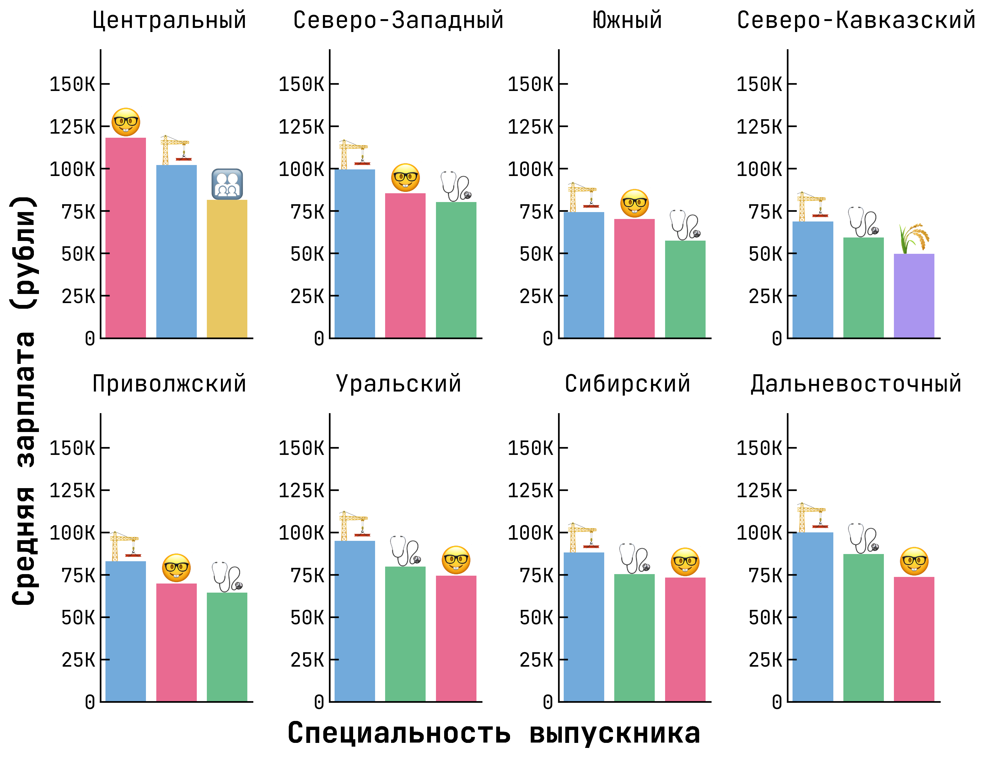

In [5]:
plot_top_salaries_by_fd(fed_dist_bachelor_df)

<span style="font-size: 20px;">cреди выпускников бакалавриата и специалитета</span>

- Только выпускники <img src="./data/img/engineer.png" width="20"/> <font color="#1E88E5">инженерных и технических</font> специальностей входят в топ-3 по среднему размеру зарплат во всех федеральных округах

- Только в Центральном округе выпускники <img src="./data/img/nerd.png" width="20"/> <font color="#ff0d57">математических и естестеннонаучных</font> специальностей получают больше остальных

- Только в Центральном округе выпускники <img src="./data/img/social.png" width="20"/> <font color="#FFC000">общественно-научных</font> специальностей входят в топ-3 по уровню зарплат

- Только в Северо-Кавказском округах выпускники <img src="./data/img/rural.png" width="20"/> <font color="#7C52FF">сельскозозяйственных</font> специальностей входят в топ-3

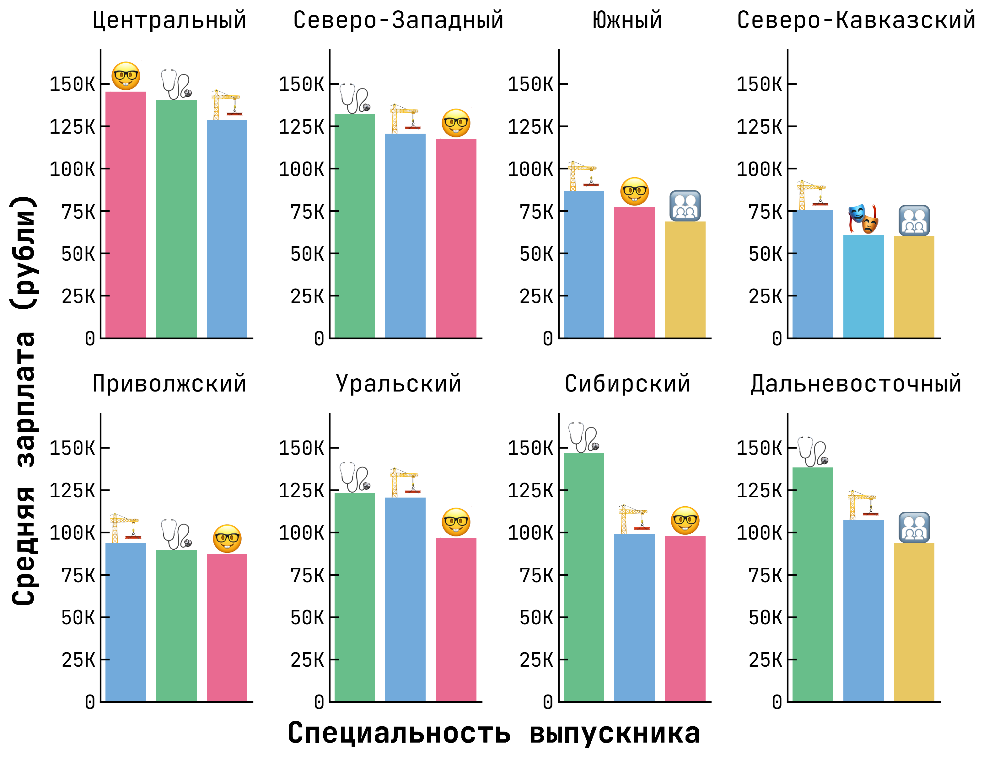

In [6]:
plot_top_salaries_by_fd(fed_dist_master_df)

<span style="font-size: 20px;">cреди выпускников магистратуры</span>

- Наиболее заметный рост зарплаты по отношению к выпускникам бакалавриата или специалитета наблюдается в Центральном и Северо-Западном федеральном округе

- Аномально большой прирост зарплаты наблюдается у выпускников <img src="./data/img/doctor.png" width="20"/> <font color="#13B755"> медицинских </font> специальностей, особенно он заметен в Сибирском и Дальневосточном округах

- Магистры <img src="./data/img/doctor.png" width="20"/> <font color="#13B755"> медицинских </font> специальностей не входят в топ-3 по уровню зарплат в Южном и Северо-Кавказском округах, _возможно связано с пропусками в данных_

- Наименьший прирост зарплаты у магистров по сравнению с бакалаврами/специалистами наблюдается в Приволжском и Северо-Кавказском округах

## Пропуски в данных

<font size="4">В Южном и Северо-Кавказском округах отсутствует информация о зарплате магистров медицинских наук: </font>

In [7]:
df1 = pd.DataFrame(fed_dist_bachelor_df.query(
    'object_name == "Южный федеральный округ"'
    '& study_area == "Здравоохранение и медицинские науки"'
    )['average_salary'])

df2 = pd.DataFrame(fed_dist_master_df.query(
    'object_name == "Южный федеральный округ"'
    '& study_area == "Здравоохранение и медицинские науки"'
    )['average_salary'])

df3 = pd.DataFrame(fed_dist_bachelor_df.query(
    'object_name == "Северо-Кавказский федеральный округ"'
    '& study_area == "Здравоохранение и медицинские науки"'
    )['average_salary'])

df4 = pd.DataFrame(fed_dist_master_df.query(
    'object_name == "Северо-Кавказский федеральный округ"'
    '& study_area == "Здравоохранение и медицинские науки"'
    )['average_salary'])

In [8]:
#| label: tbl-ref
#| tbl-cap: "Южный федеральный округ"
#| tbl-subcap:
#|  - "Бакалавры/специалисты"
#|  - "Магистры"
#| layout-ncol: 2
#| echo: fenced

display(df1)
display(df2)

,average_salary
3122,72838.30634
3130,70779.21762
3138,57534.04568
3146,48477.49281
3154,41583.38503


,average_salary
3169,NaN
3177,NaN
3185,NaN


In [9]:
#| label: tbl-ref-2
#| tbl-cap: "Северо-Кавказский федеральный округ"
#| tbl-subcap:
#|  - "Бакалавры/специалисты"
#|  - "Магистры (нет записей)"
#| layout-ncol: 2
#| echo: fenced

display(df3)
display(df4)

,average_salary
3265,68271.08231
3273,64426.35973
3281,59316.38948
3289,50192.02503
3297,43859.00063


,average_salary


Алена Манузина:

> По федеральным округам — надо проверять, но учитывая размер набора, __можно предположить, что в ЮФО и СКФО медицинской магистратуры просто нигде нет__. Если верить этим [товарищам](https://postupi.online/programmy-obucheniya/magistratura/razdel-medicina-i-zdravoohranenie/?ysclid=m018bo4gav132603698), такая магистратура есть в Москве, СПб, Казани, Томске, Рязани, Тамбове и Владивостоке.

***

## Средние зарплаты выпускников

<font size="5">по стране в целом для выпускников <font color="#00AEEF">бакалавриата/специалитета</font> и <font color="#ff0d57">магистратуры</font>: </font>

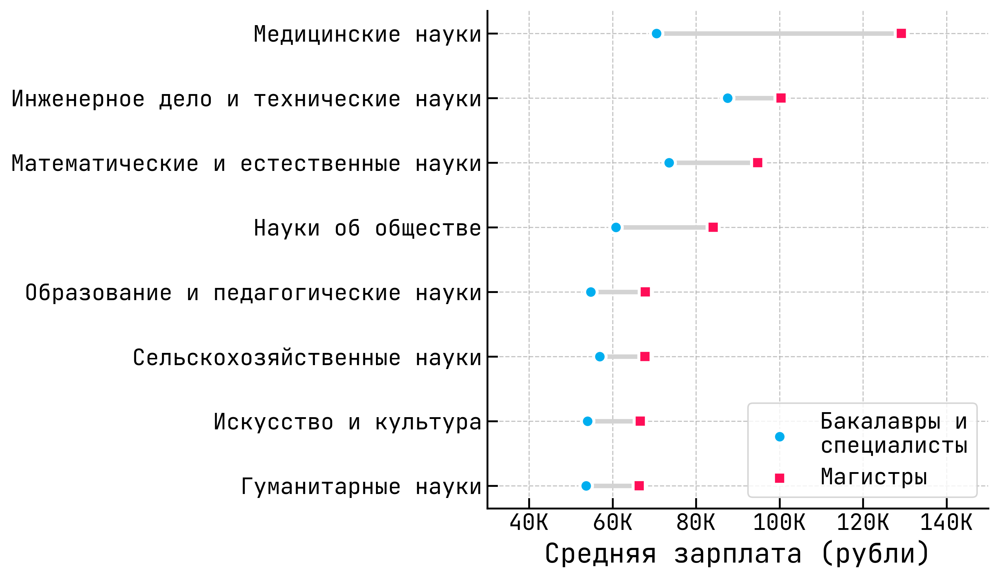

In [10]:
def salary_by_area_stat(df):
    return pd.DataFrame(df.groupby('study_area')['average_salary'].median())

fig, ax = plt.subplots(figsize=(6, 6))

def bachelor_vs_master(bachelor_df, master_df, ax, stat_func, no_med=False):

    bachelor_stat_df = stat_func(bachelor_df)
    master_stat_df = stat_func(master_df)

    total_stat_df = bachelor_stat_df.merge(
        master_stat_df, on='study_area', how='left',
        suffixes=['_bachelor', '_master']
        ).sort_values(by='average_salary_master', ascending=False)
    
    if no_med:
        total_stat_df = total_stat_df.query(
            'study_area != "Здравоохранение и медицинские науки"'
            )

    total_stat_df.index = (
        total_stat_df.index
        .str.replace('Здравоохранение и м', 'М')
        .str.replace(', технологии', '')
        .str.replace('Сельское хозяйство и с', 'C')
    )

    sns.scatterplot(
        total_stat_df, x='average_salary_bachelor', y='study_area', s=70,
        ax=ax, zorder=5, color="#00AEEF", label='Бакалавры и\nспециалисты', lw=2
        )
    
    sns.scatterplot(
        total_stat_df, x='average_salary_master', y='study_area', s=70,
        ax=ax, zorder=5, color='#ff0d57', label='Магистры', lw=2,
        marker='s'
        )
    
    for area, row in total_stat_df.iterrows():
        ax.plot(
            (row.average_salary_bachelor, row.average_salary_master),
            (area, area), color='lightgray', lw=3
            )

    ax.xaxis.set_major_formatter(plt.FuncFormatter(format_yticks))
    ax.set_xlim(3e4, 1.5e5)
    ax.grid()
    ax.legend(loc='lower right')
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    # plt.show()

    ax.set_xlabel('Средняя зарплата (рубли)')
    ax.set_ylabel('')

    return (bachelor_stat_df, master_stat_df, total_stat_df), ax

dfs, ax = bachelor_vs_master(
    fed_dist_bachelor_df, fed_dist_master_df, ax, stat_func=salary_by_area_stat
    )

Алена Манузина:

>Формально медицинская магистратура существует (направления есть в [перечне](https://base.garant.ru/70480868/f7ee959fd36b5699076b35abf4f52c5c/?ysclid=m017r6vprq81404464) и, например, [здесь](https://www.sechenov.ru/univers/structure/center/tsentr-magisterskikh-programm/mag/?ysclid=m017p97xpx668510986) — все, что с кодами на 32, 33 и 34). Другое дело, что __это подготовка скорее к управленческим позициям, поэтому на них идут уже взрослые и опытные люди (это единственная группа со средним возрастом выпускников 35+), отсюда и разница в зарплате между выпускниками бакалавриата/специалитета и магистратуры__. Плюс наборы очень маленькие — по данным Роструда это 100-200 человек на всю страну в разные годы, поэтому расчеты на основе этих данных и сопоставление с другими областями образования могут быть очень ненадежными.

<div class="alert alert-info"> <b>⚠︎ </b> Исключим выпускников медицинских специальностей из рассмотрения, поскольку данные об их зарплатах смещены </div>

## Топ-3 специальностей по среднему размеру зарплат по федеральным округам

В топах по округам представлены выпускники следующих спецальностей:

<img src="./data/img/engineer.png" width="25"/> <font color="#1E88E5">инженерных и технических</font>

<img src="./data/img/nerd.png" width="25"/> <font color="#ff0d57">математических и естестеннонаучных</font>

<img src="./data/img/books.png" width="25"/> <font color="#70b58c"> педагогических </font>

<img src="./data/img/social.png" width="25"/> <font color="#FFC000">общественно-научных</font>

<img src="./data/img/rural.png" width="25"/> <font color="#7C52FF">сельскозозяйственных</font>



__Из выборки исключены данные о выпускниках медицинских специальностей.__

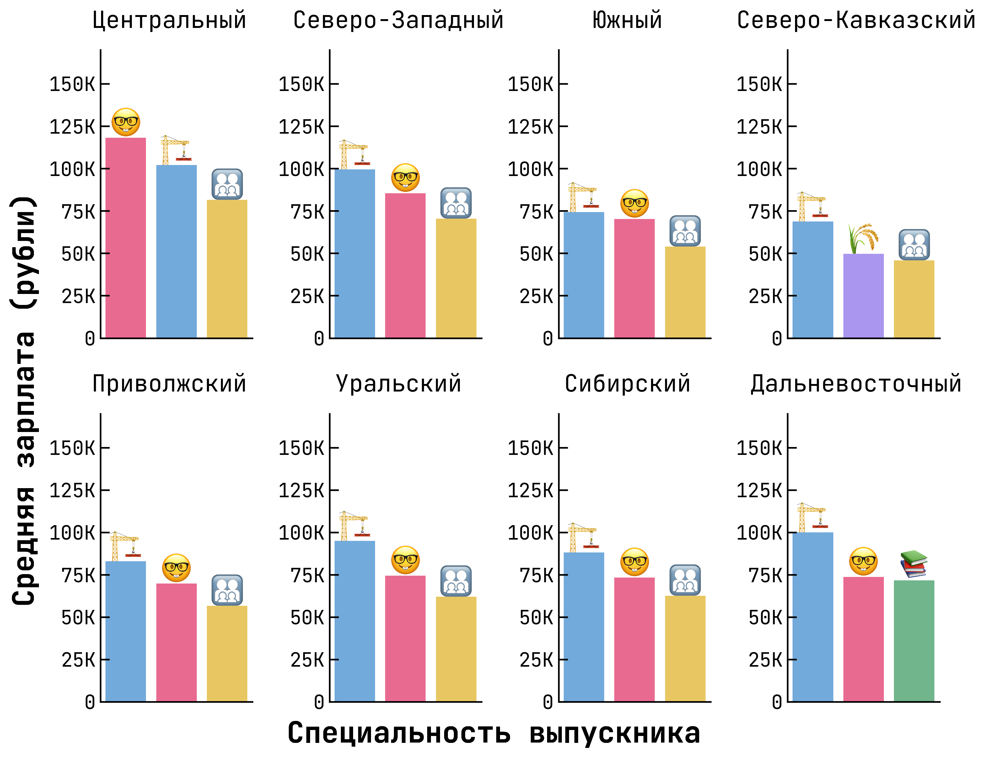

In [11]:
plot_top_salaries_by_fd(fed_dist_bachelor_df, no_med=True)

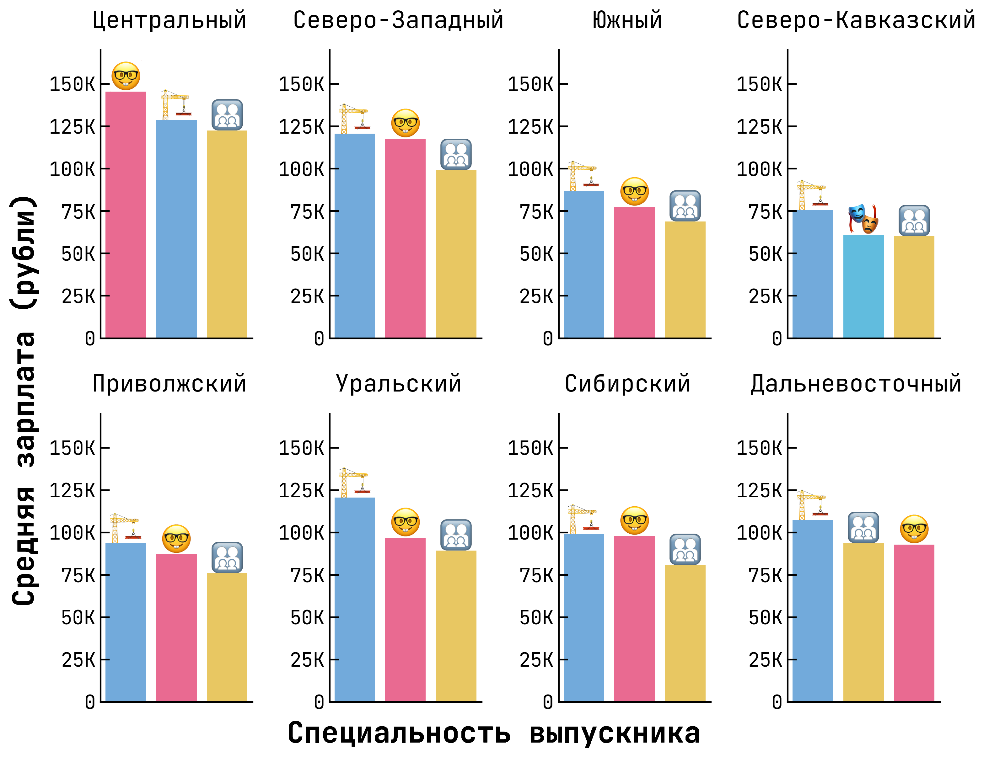

In [12]:
plot_top_salaries_by_fd(fed_dist_master_df, no_med=True)

Топ-3 специальностей по размеру зарплат в разных федеральных округах для выпускников магистратуры стал гораздо более похож на аналогичное распределение для выпускников бакалавриата/специалитета после исключения из рассмотрения смещенных данных о выпускниках медицинских специальностей

## Разница в средней зарплате между выпускниками разных направлений

<font size="5">по стране в целом для выпускников <font color="#00AEEF">бакалавриата/специалитета</font> и <font color="#ff0d57">магистратуры</font>: </font>

__Из выборки исключены данные о выпускниках медицинских специальностей.__

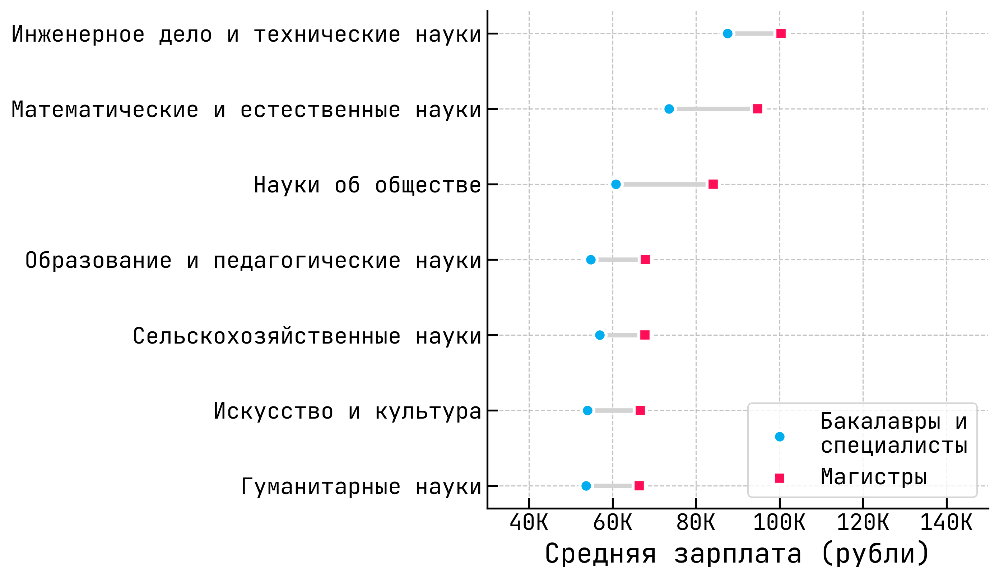

In [13]:
fig, ax = plt.subplots(figsize=(6, 6))

dfs, ax = bachelor_vs_master(
    fed_dist_bachelor_df, fed_dist_master_df, ax,
    stat_func=salary_by_area_stat, no_med=True
    )

<font size="5">в отдельных округах для выпускников <font color="#00AEEF">бакалавриата/специалитета</font> и <font color="#ff0d57">магистратуры</font>: </font>

__Из выборки исключены данные о выпускниках медицинских специальностей.__

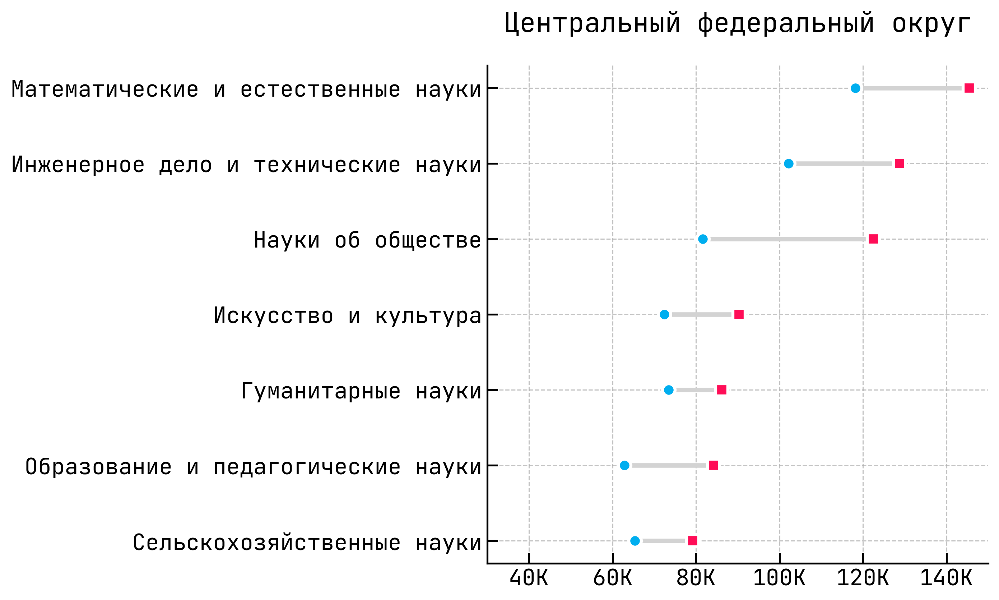

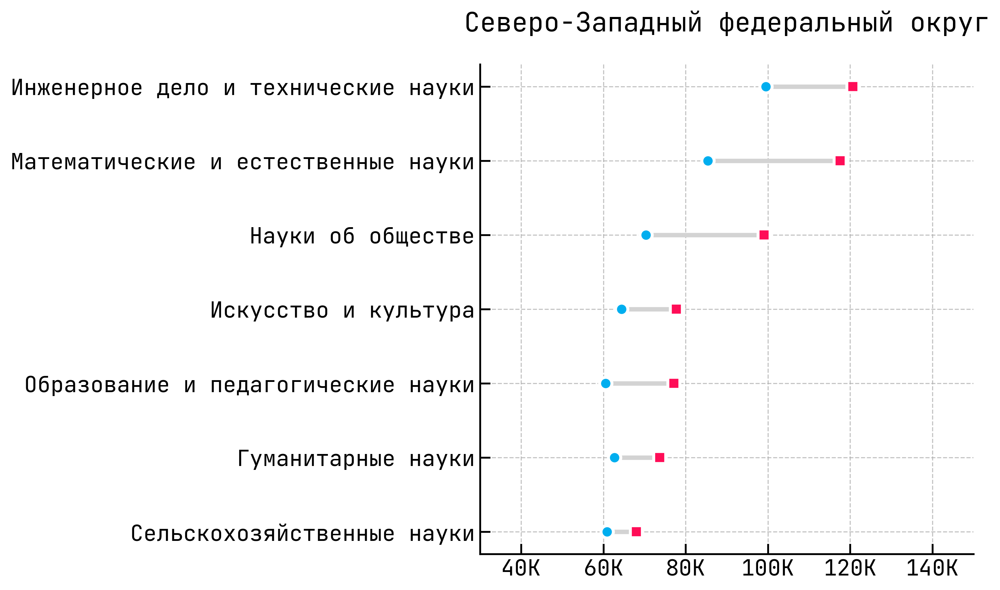

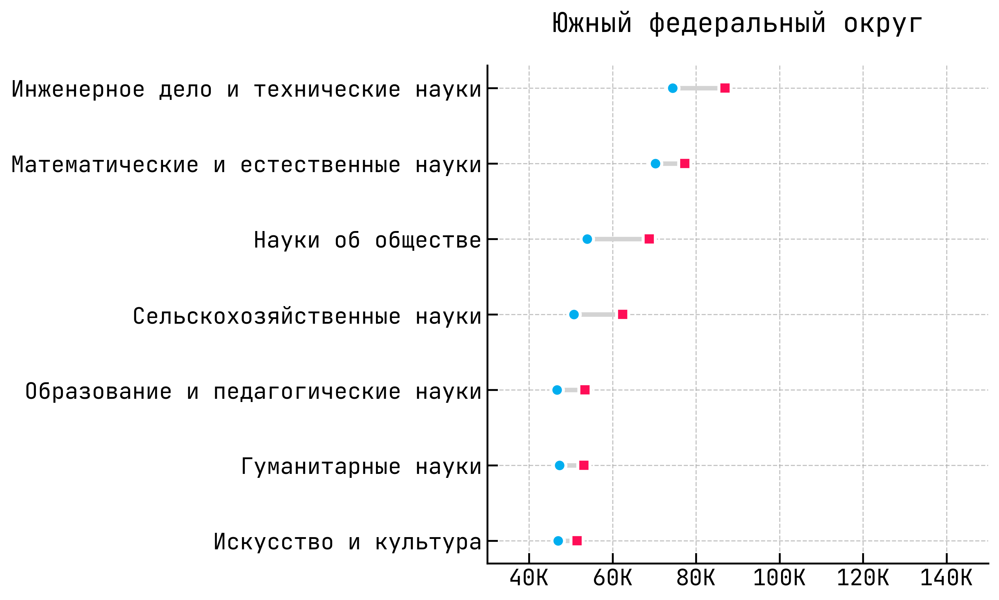

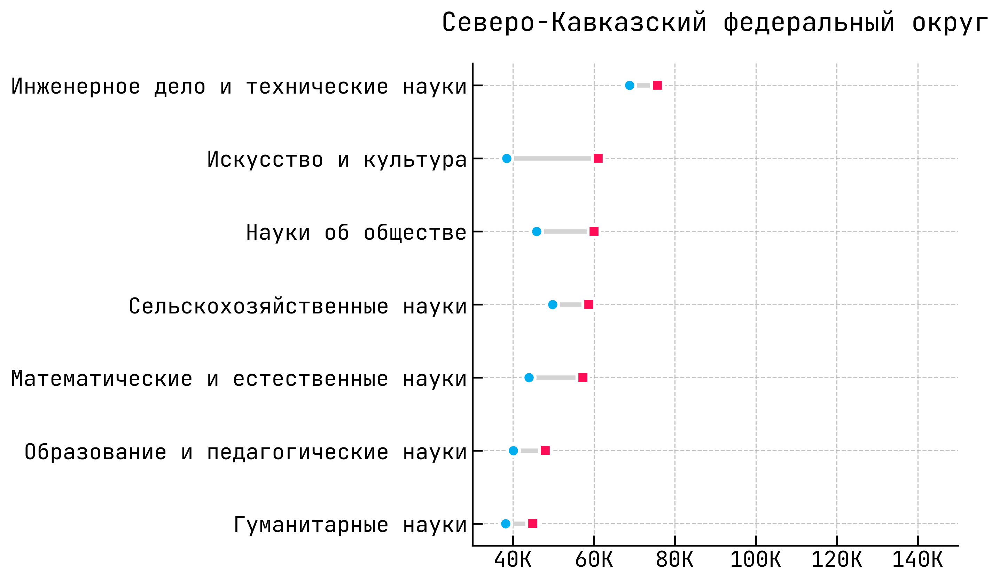

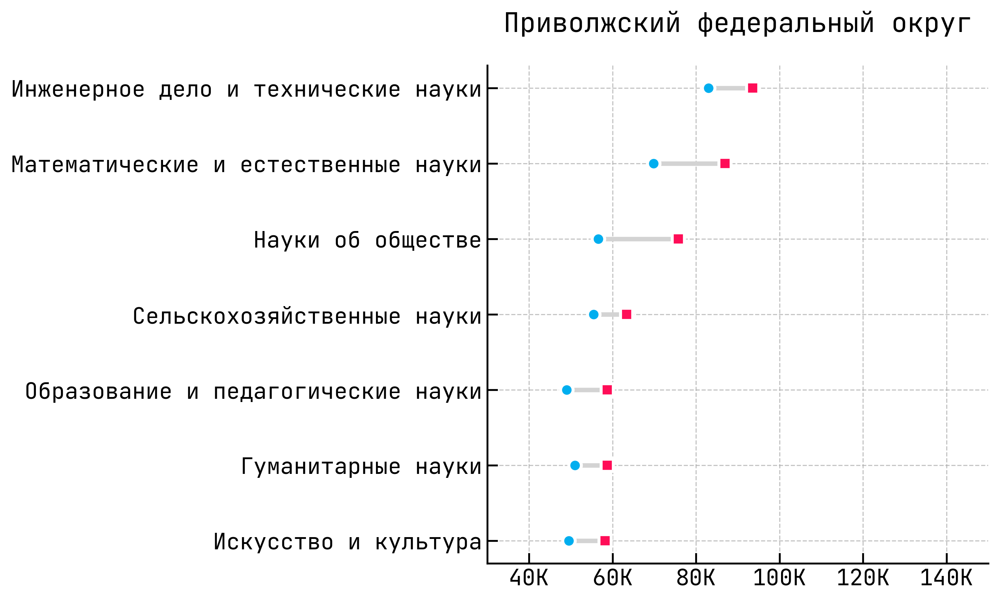

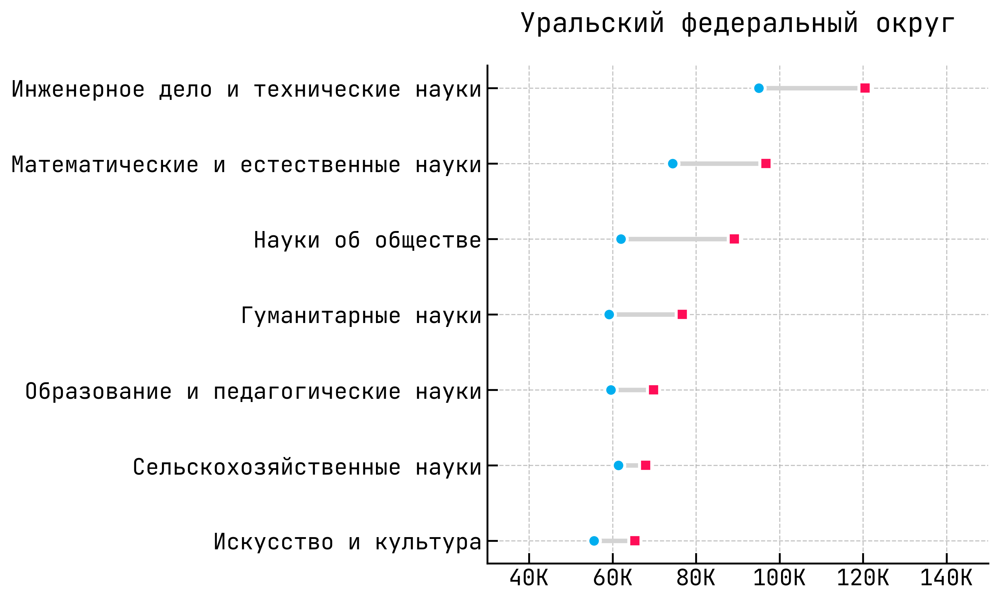

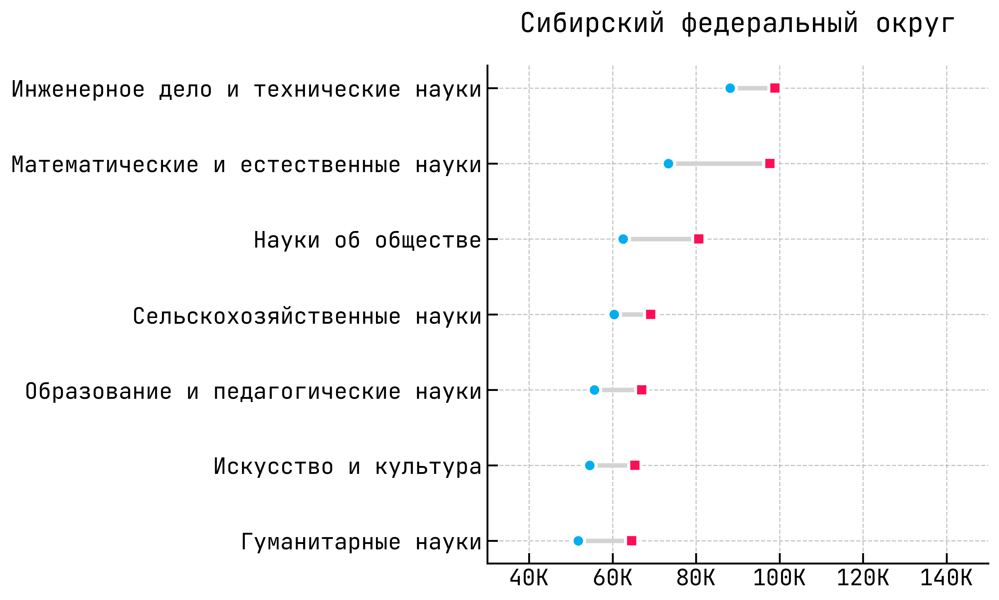

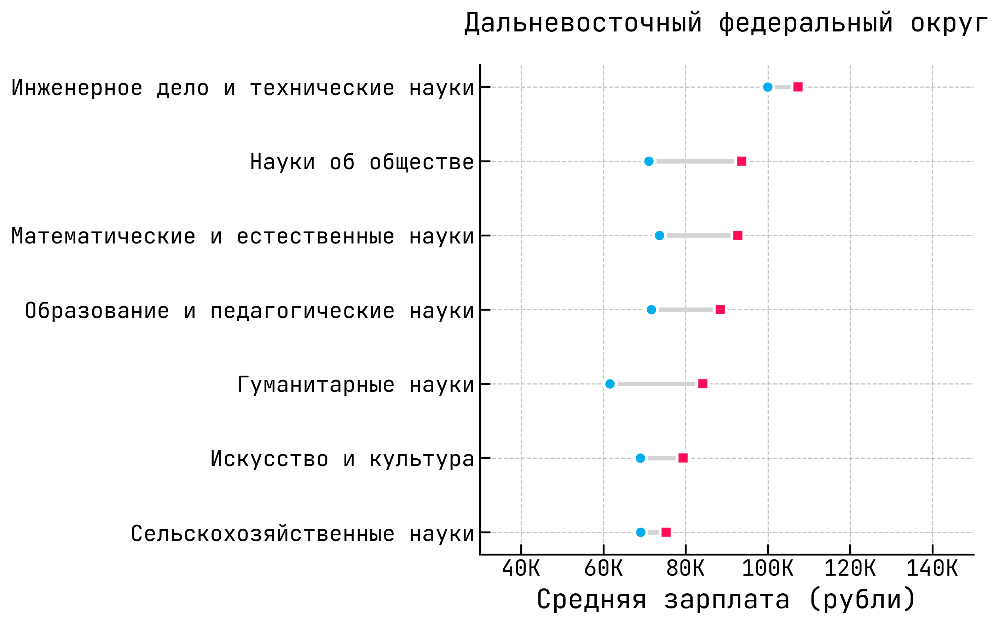

In [14]:
unique_objects = fed_dist_bachelor_df['object_name'].unique()

for i, fed_dist in enumerate(unique_objects):

    fed_master_df = fed_dist_master_df.query(f'object_name == "{fed_dist}"')
    fed_bachelor_df = fed_dist_bachelor_df.query(f'object_name == "{fed_dist}"')

    fig, ax = plt.subplots(figsize=(6, 6))
    dfs, ax = bachelor_vs_master(
        fed_bachelor_df, fed_master_df, ax,
        stat_func=salary_by_area_stat, no_med=True
        )
    ax.legend().remove()
    if i != len(unique_objects) - 1:
        ax.set_xlabel('')
    ax.set_title(fed_dist, y=1.05)

***

In [15]:
# fed_dist_bachelor_male_df = smaller_df.query(
#     'object_level == "Федеральный округ" &'
#     'education_level == "Бакалавриат, специалитет" &'
#     'gender == "Мужской" &'
#     'study_area != "Здравоохранение и медицинские науки"')

# fed_dist_bachelor_fem_df = smaller_df.query(
#     'object_level == "Федеральный округ" &'
#     'education_level == "Бакалавриат, специалитет" &'
#     'gender == "Женский" &'
#     'study_area != "Здравоохранение и медицинские науки"')
# def salary_by_district_stat(df):
#     return pd.DataFrame(df.groupby('object_name')['average_salary'].median())


# def male_vs_fem(df1, df2, ax, stat_func):

#     df1_stat = stat_func(df1)
#     df2_stat = stat_func(df2)

#     total_stat_df = df1_stat.merge(
#         df2_stat, on='object_name', how='left',
#         suffixes=['_male', '_fem']
#         )
    
#     total_stat_df['salary_diff'] = (
#         total_stat_df['average_salary_male'] - total_stat_df['average_salary_fem']
#         )
    
#     total_stat_df = total_stat_df.sort_values('salary_diff', ascending=True)

#     total_stat_df.index = (
#         total_stat_df.index
#         .str.replace('федеральный округ', '')
#     )
    
#     for object, row in total_stat_df.iterrows():
#         ax.text(
#             row['average_salary_male'], object, 'M', fontsize=14,
#             color="#00AEEF", zorder=5, weight=1000
#             )
#         ax.text(
#             row['average_salary_fem'] - 2e3, object, 'Ж', fontsize=14,
#             color="#ff0d57", zorder=5, weight=1000
#             )
#         ax.plot(
#             (row.average_salary_male, row.average_salary_fem),
#             (object, object), color='lightgray', lw=3
#             )

#     ax.xaxis.set_major_formatter(plt.FuncFormatter(format_yticks))
#     ax.set_xlim(3e4, 1.2e5)
#     ax.grid()
#     # ax.legend(loc='lower right')
#     ax.spines['right'].set_visible(False)
#     ax.spines['top'].set_visible(False)
#     # plt.show()

#     ax.set_xlabel('Средняя зарплата (рубли)')
#     ax.set_ylabel('')

#     return (df1_stat, df2_stat, total_stat_df), ax


# fig, ax = plt.subplots(figsize=(6, 6))
# dfs, ax = male_vs_fem(
#     fed_dist_bachelor_male_df, fed_dist_bachelor_fem_df, ax,
#     stat_func=salary_by_district_stat
#     )

In [17]:
def salary_by_district_stat(df):
    return pd.DataFrame(df.groupby('object_name')['average_salary'].median())


def male_vs_fem(df1, df2, stat_func):

    df1_stat = stat_func(df1)
    df2_stat = stat_func(df2)

    total_stat_df = df1_stat.merge(
        df2_stat, on='object_name', how='left',
        suffixes=['_male', '_fem']
        )
    
    total_stat_df['salary_diff'] = (
        total_stat_df['average_salary_male'] - total_stat_df['average_salary_fem']
        )
    
    total_stat_df = total_stat_df.sort_values('salary_diff', ascending=True)

    total_stat_df.index = (
        total_stat_df.index
        .str.replace('федеральный округ', '')
    )

    return total_stat_df

## Гендерные различия

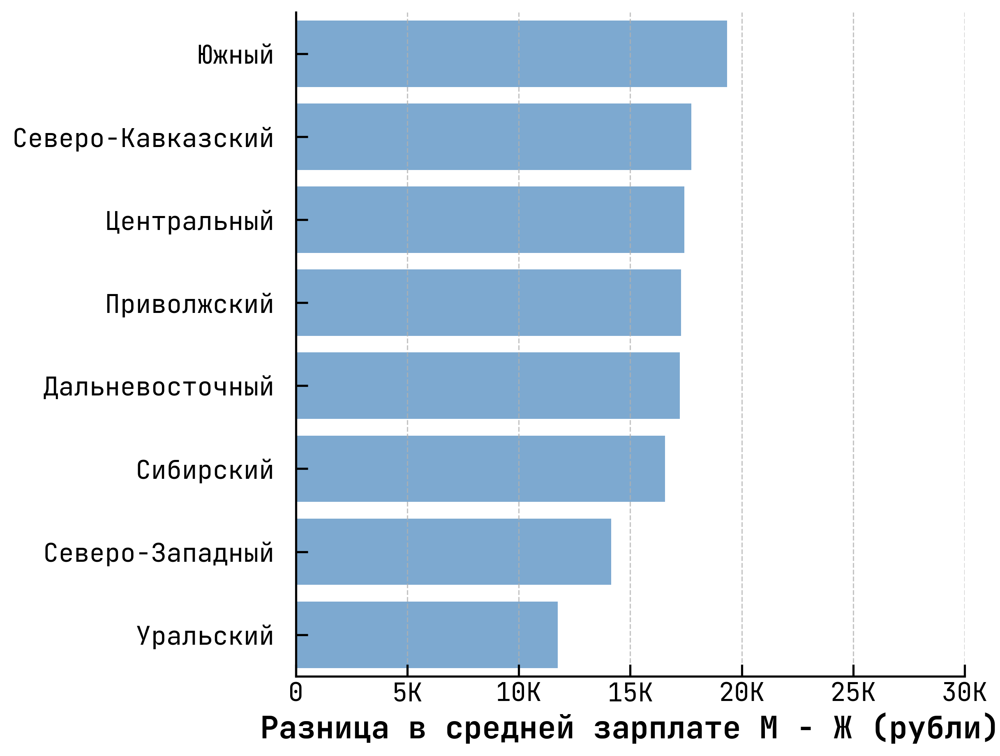

In [21]:
fed_dist_bachelor_male_df = smaller_df.query(
    'object_level == "Федеральный округ" &'
    'education_level == "Бакалавриат, специалитет" &'
    'gender == "Мужской" &'
    'study_area != "Здравоохранение и медицинские науки"')

fed_dist_bachelor_fem_df = smaller_df.query(
    'object_level == "Федеральный округ" &'
    'education_level == "Бакалавриат, специалитет" &'
    'gender == "Женский" &'
    'study_area != "Здравоохранение и медицинские науки"')

fig, ax = plt.subplots(figsize=(7, 7))

bachelor_gender_diff_df = male_vs_fem(
    fed_dist_bachelor_male_df, fed_dist_bachelor_fem_df,
    stat_func=salary_by_district_stat
    )

sns.barplot(
    data=bachelor_gender_diff_df.sort_values('salary_diff', ascending=False),
    y=bachelor_gender_diff_df.index, x='salary_diff', orient='h',
    alpha=.7
    )

ax.xaxis.set_major_formatter(plt.FuncFormatter(format_yticks))
ax.set_xlim(0, 3e4)

ax.grid(axis='x')
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
# ax.set_title('Выпускники бакалавриата/специалитета', y=1.05)
ax.set_ylabel('')
ax.set_xlabel('Разница в средней зарплате М - Ж (рубли)', weight='bold')

plt.show()

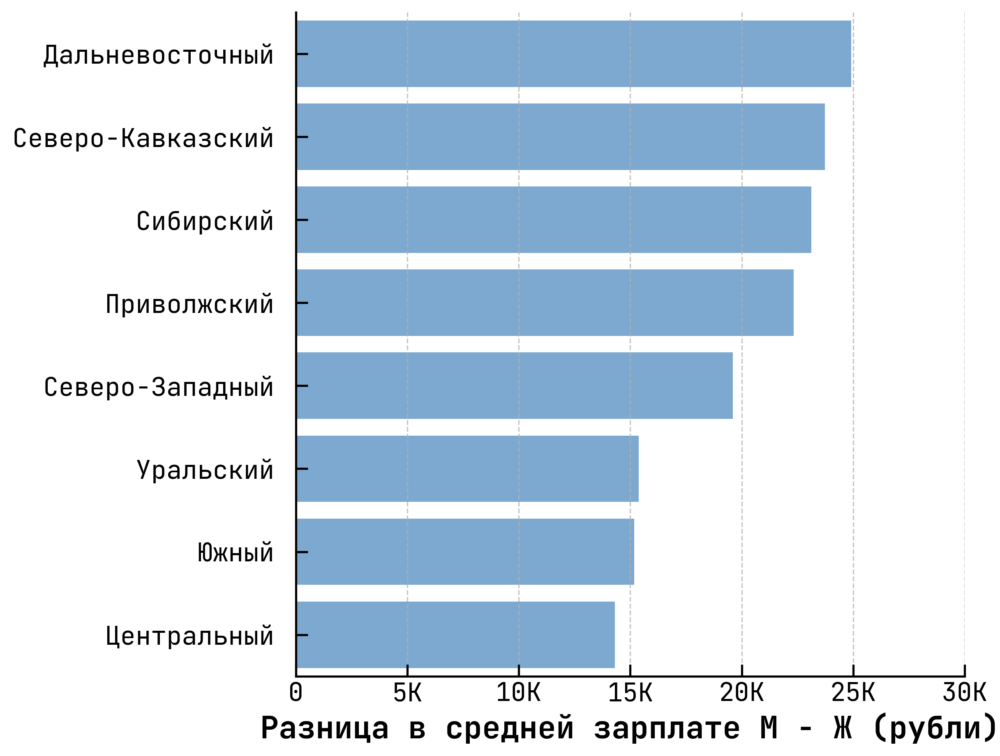

In [23]:
fed_dist_master_male_df = smaller_df.query(
    'object_level == "Федеральный округ" &'
    'education_level == "Магистратура" &'
    'gender == "Мужской" &'
    'study_area != "Здравоохранение и медицинские науки"')

fed_dist_master_fem_df = smaller_df.query(
    'object_level == "Федеральный округ" &'
    'education_level == "Магистратура" &'
    'gender == "Женский" &'
    'study_area != "Здравоохранение и медицинские науки"')

fig, ax = plt.subplots(figsize=(7, 7))

master_gender_diff_df = male_vs_fem(
    fed_dist_master_male_df, fed_dist_master_fem_df,
    stat_func=salary_by_district_stat
    )

sns.barplot(
    data=master_gender_diff_df.sort_values('salary_diff', ascending=False),
    y=master_gender_diff_df.index, x='salary_diff', orient='h',
    alpha=.7
    )

ax.grid(axis='x')
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.set_ylabel('')
# ax.set_title('Выпускники магистратуры', y=1.05)
ax.set_xlabel('Разница в средней зарплате М - Ж (рубли)', weight='bold')
ax.xaxis.set_major_formatter(plt.FuncFormatter(format_yticks))
ax.set_xlim(0, 3e4)

plt.show()

<!-- <font color="gray">

- ~~Есть ли разница между зарплатами магистров и баколавров/специалистов?~~

- Нужно ли нанести долю занятых на карту?

- ~~Отобразить прирост зарплат на графике образовательная категория - изменение~~

- ~~Проявляются ли гендерные различия?~~

- Подстроить шрифт под Кварто -->